In [1]:
import os
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, LeakyReLU, ReLU, Dropout, BatchNormalization, Concatenate, Input
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

2025-07-02 13:56:18.555374: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1751464578.751936      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1751464578.805022      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
IMG_HEIGHT = 256
IMG_WIDTH = 256
BATCH_SIZE = 16

# Caminhos das pastas no Kaggle
path_gray = '/kaggle/input/landscape-image-colorization/landscape Images/gray'
path_color = '/kaggle/input/landscape-image-colorization/landscape Images/color'

In [3]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

def preprocess_image(gray_path, color_path):
    gray_img = load_img(gray_path, target_size=(256, 256), color_mode='grayscale')
    gray_img = img_to_array(gray_img)  # (256, 256, 1)

    color_img = load_img(color_path, target_size=(256, 256), color_mode='rgb')
    color_img = img_to_array(color_img)  # (256, 256, 3)

    gray_img = gray_img.astype("float32") / 127.5 - 1
    color_img = color_img.astype("float32") / 127.5 - 1

    return gray_img, color_img

# Criar lista de arquivos
file_names = sorted(os.listdir(path_gray))

def data_generator():
    for fname in file_names:
        g_path = os.path.join(path_gray, fname)
        c_path = os.path.join(path_color, fname)
        if os.path.exists(c_path):
            try:
                gray_img, color_img = preprocess_image(g_path, c_path)
                yield gray_img, color_img
            except Exception as e:
                print(f"Erro ao processar {fname}: {e}")

In [4]:
dataset = tf.data.Dataset.from_generator(
    data_generator,
    output_signature=(
        tf.TensorSpec(shape=(256, 256, 1), dtype=tf.float32),
        tf.TensorSpec(shape=(256, 256, 3), dtype=tf.float32)
    )
).shuffle(1000).batch(16).prefetch(tf.data.AUTOTUNE)

I0000 00:00:1751464593.166038      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1751464593.166714      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


In [5]:
# Downsample block
def downsample(filters, size=4, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(Conv2D(filters, size, strides=2, padding='same',
                      kernel_initializer=initializer, use_bias=False))
    if apply_batchnorm:
        result.add(BatchNormalization())
    result.add(LeakyReLU())
    return result

# Upsample block
def upsample(filters, size=4, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(Conv2DTranspose(filters, size, strides=2, padding='same',
                               kernel_initializer=initializer, use_bias=False))
    result.add(BatchNormalization())
    if apply_dropout:
        result.add(Dropout(0.5))
    result.add(ReLU())
    return result

# Generator: U-Net
def Generator():
    inputs = Input(shape=[256, 256, 1])
    down_stack = [
        downsample(64, apply_batchnorm=False), # (128, 128, 64)
        downsample(128),                       # (64, 64, 128)
        downsample(256),                       # (32, 32, 256)
        downsample(512),                       # (16, 16, 512)
        downsample(512),                       # (8, 8, 512)
        downsample(512),                       # (4, 4, 512)
        downsample(512),                       # (2, 2, 512)
        downsample(512),                       # (1, 1, 512)
    ]
    up_stack = [
        upsample(512, apply_dropout=True),     # (2, 2, 1024)
        upsample(512, apply_dropout=True),     # (4, 4, 1024)
        upsample(512, apply_dropout=True),     # (8, 8, 1024)
        upsample(512),                         # (16, 16, 1024)
        upsample(256),                         # (32, 32, 512)
        upsample(128),                         # (64, 64, 256)
        upsample(64),                          # (128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(3, 4,
                           strides=2,
                           padding='same',
                           kernel_initializer=initializer,
                           activation='tanh')  # (256, 256, 3)

    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs=inputs, outputs=x)

In [6]:
# Discriminator: PatchGAN
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    inp = Input(shape=[256, 256, 1], name='input_image')
    tar = Input(shape=[256, 256, 3], name='target_image')
    x = Concatenate()([inp, tar])  # (256, 256, 4)

    down1 = downsample(64, apply_batchnorm=False)(x)   # (128, 128, 64)
    down2 = downsample(128)(down1)                      # (64, 64, 128)
    down3 = downsample(256)(down2)                      # (32, 32, 256)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)
    conv = Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1)
    batchnorm = BatchNormalization()(conv)
    leaky_relu = LeakyReLU()(batchnorm)
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)

    last = Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)  # (30, 30, 1)

    return Model(inputs=[inp, tar], outputs=last)

# Loss functions
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_obj(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_obj(tf.zeros_like(disc_generated_output), disc_generated_output)
    return real_loss + generated_loss

def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_obj(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    total_gen_loss = gan_loss + (100 * l1_loss)
    return total_gen_loss

In [7]:
# Otimizadores
generator = Generator()
discriminator = Discriminator()
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [8]:
# Treinamento
@tf.function
def train_step(input_image, target):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))


In [9]:
# Mostrar previsões
def generate_images(model, test_input, target):
    prediction = model(test_input, training=False)[0]
    plt.figure(figsize=(15, 5))

    display_list = [test_input[0], target[0], prediction]
    title = ['Input Gray', 'Target Color', 'Predicted Color']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        img = display_list[i]
        if img.shape[-1] == 1:
            img = tf.squeeze(img, axis=-1)
            plt.imshow((img + 1) / 2.0, cmap='gray')
        else:
            plt.imshow((img + 1) / 2.0)
        plt.title(title[i])
        plt.axis('off')
    plt.show()


🔁 Época 1/30


E0000 00:00:1751464624.184378      19 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_15_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1751464624.889681      60 cuda_dnn.cc:529] Loaded cuDNN version 90300


 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400


E0000 00:00:1751464903.693165      19 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_15_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


🎨 Resultados da época 1


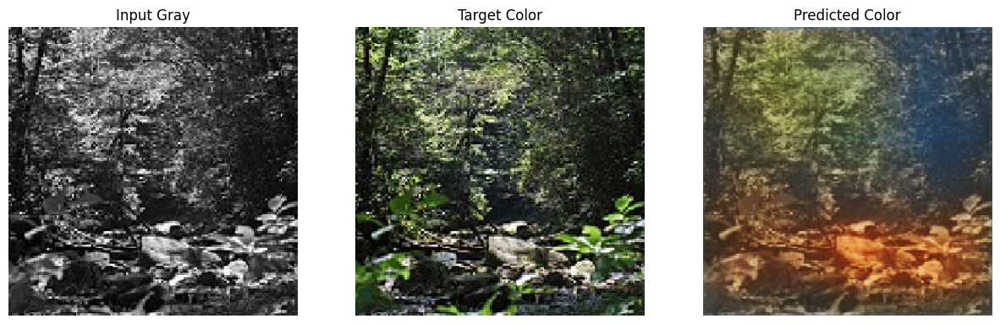

⏱️ Tempo da época 1: 319.14s

🔁 Época 2/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 2


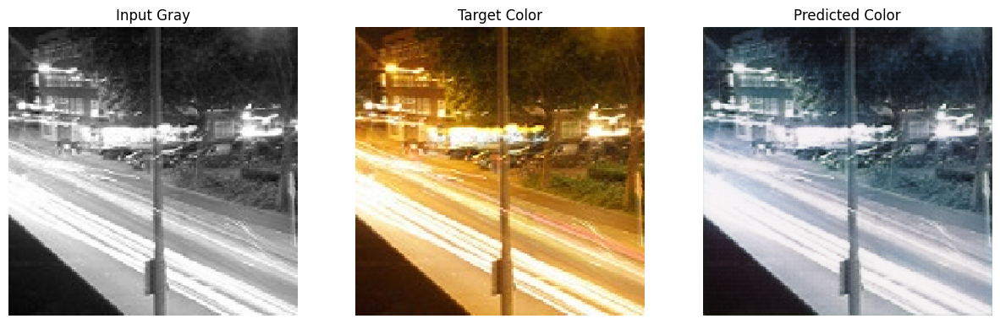

⏱️ Tempo da época 2: 281.73s

🔁 Época 3/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 3


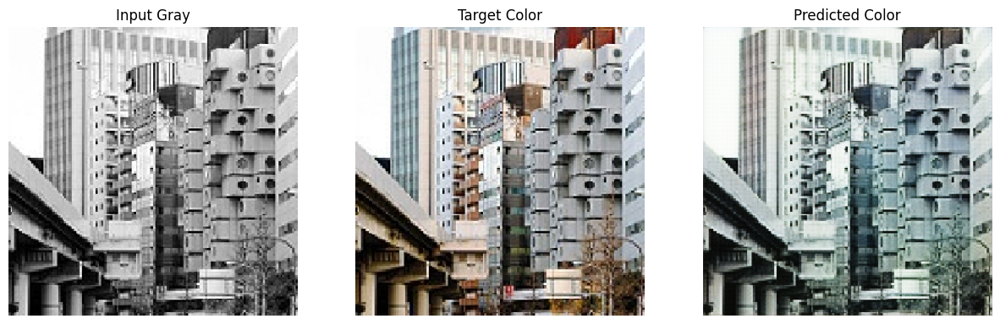

⏱️ Tempo da época 3: 281.50s

🔁 Época 4/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 4


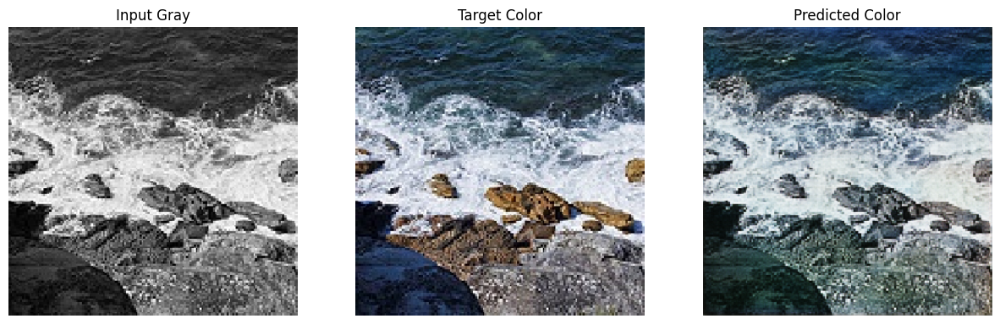

⏱️ Tempo da época 4: 281.65s

🔁 Época 5/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 5


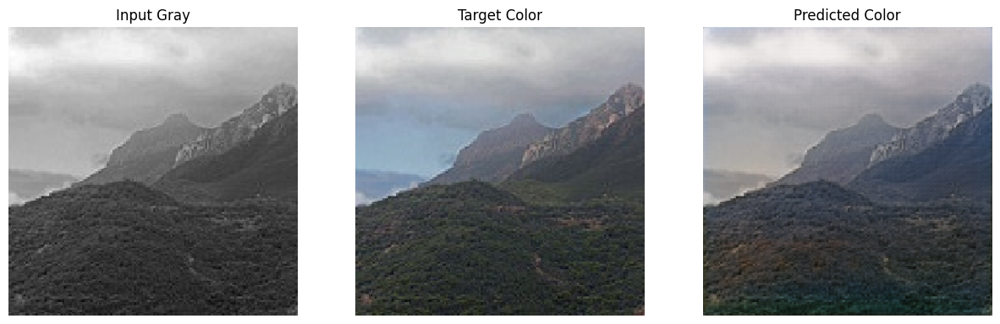

⏱️ Tempo da época 5: 281.17s

🔁 Época 6/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 6


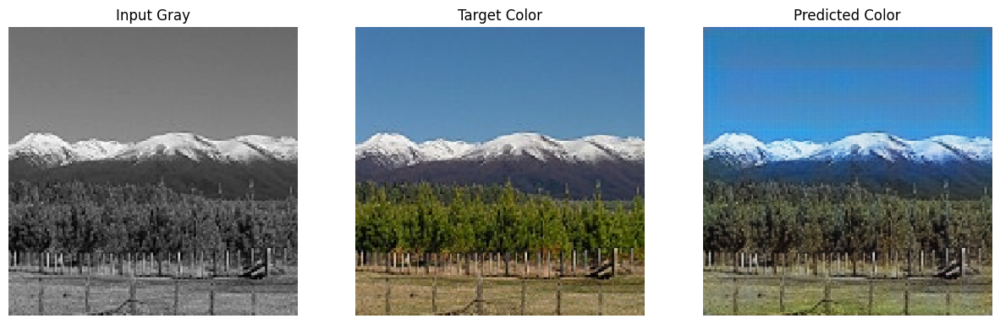

⏱️ Tempo da época 6: 281.72s

🔁 Época 7/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 7


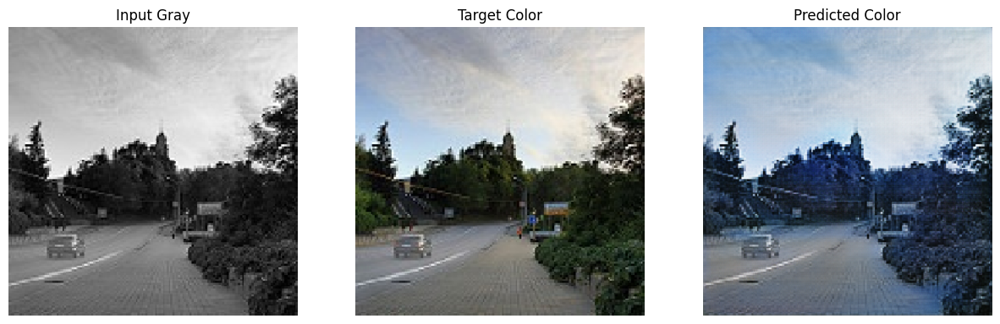

⏱️ Tempo da época 7: 281.30s

🔁 Época 8/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 8


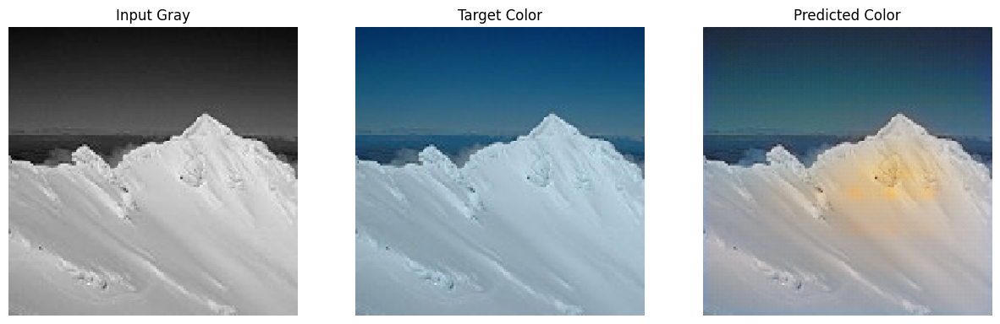

⏱️ Tempo da época 8: 280.61s

🔁 Época 9/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 9


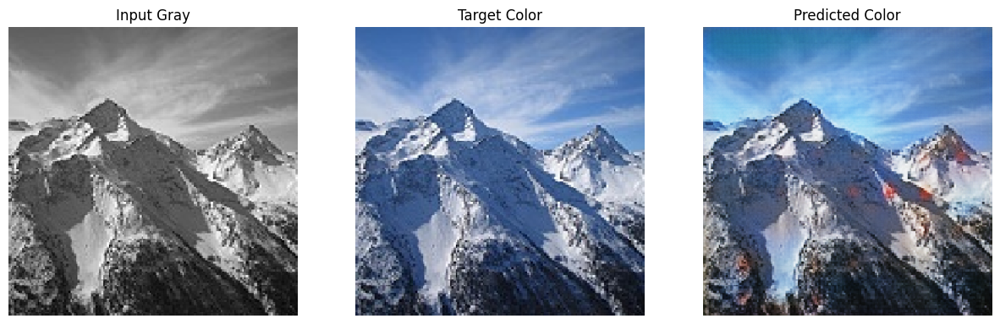

⏱️ Tempo da época 9: 280.90s

🔁 Época 10/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 10


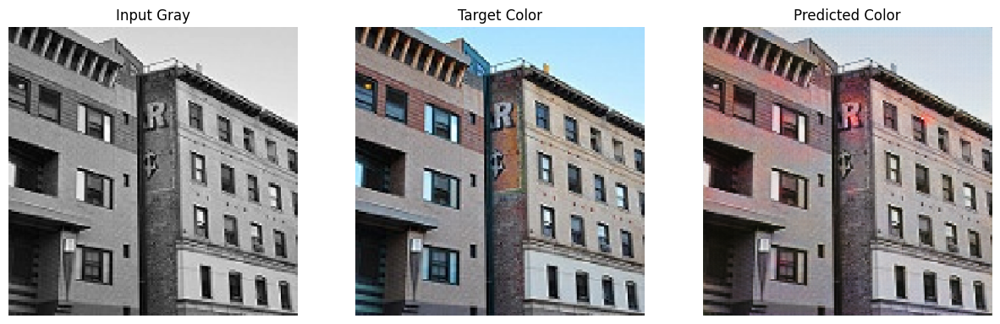

⏱️ Tempo da época 10: 280.11s

🔁 Época 11/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 11


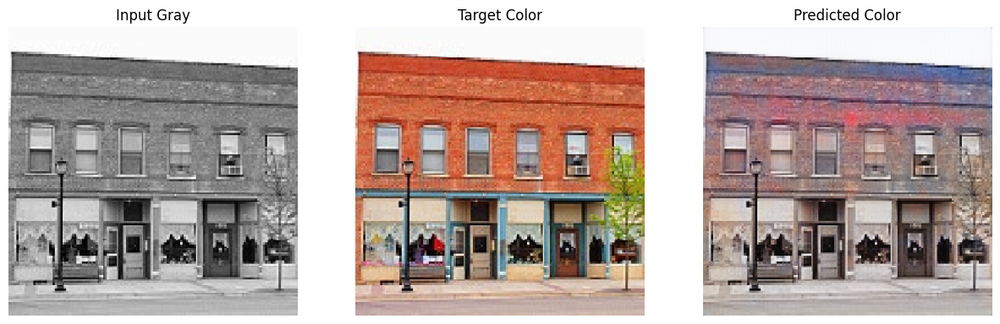

⏱️ Tempo da época 11: 279.75s

🔁 Época 12/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 12


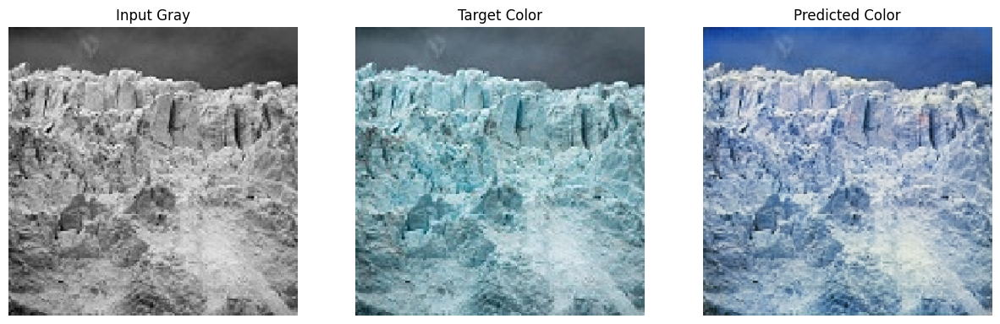

⏱️ Tempo da época 12: 280.46s

🔁 Época 13/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 13


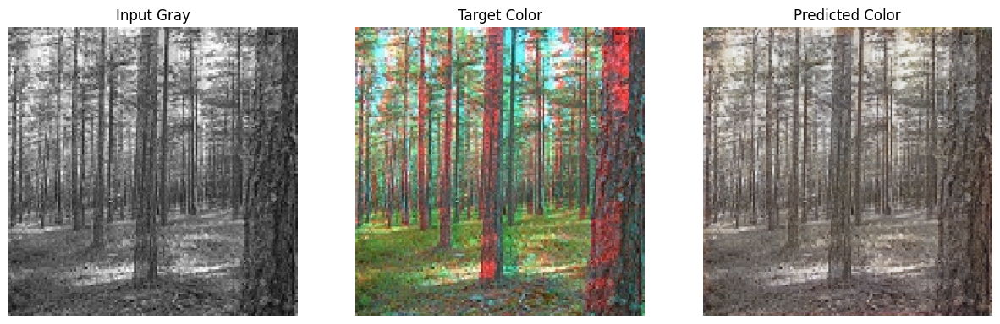

⏱️ Tempo da época 13: 280.40s

🔁 Época 14/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 14


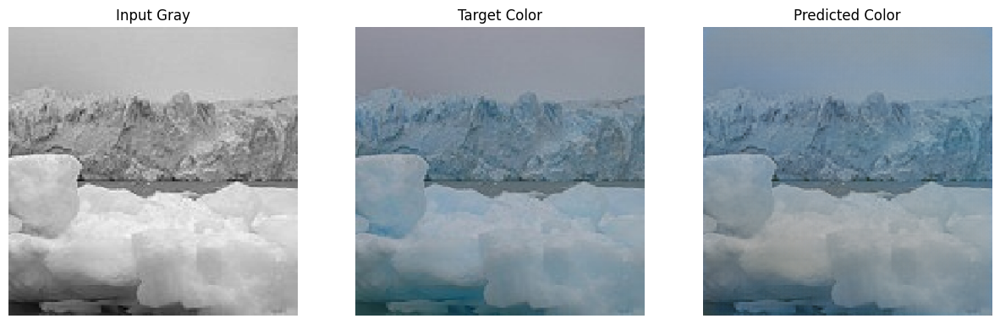

⏱️ Tempo da época 14: 280.17s

🔁 Época 15/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 15


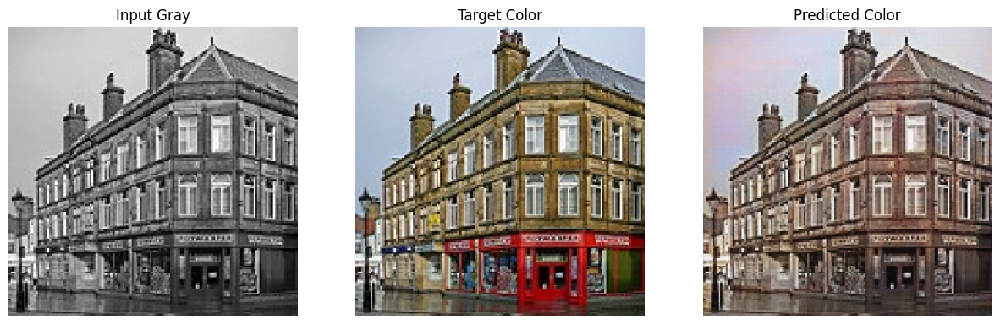

⏱️ Tempo da época 15: 280.44s

🔁 Época 16/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 16


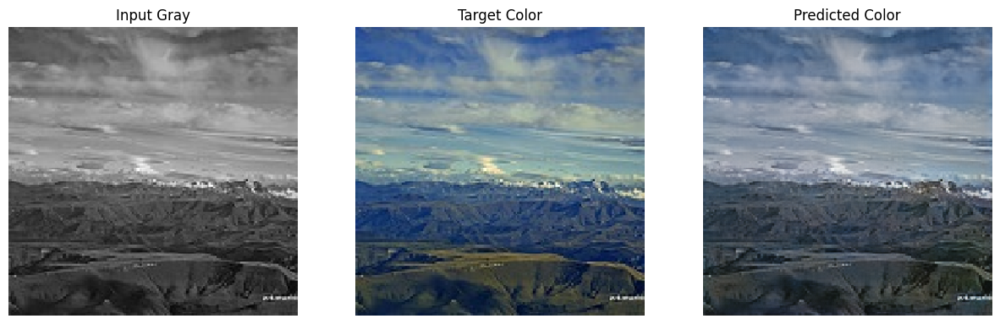

⏱️ Tempo da época 16: 280.41s

🔁 Época 17/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 17


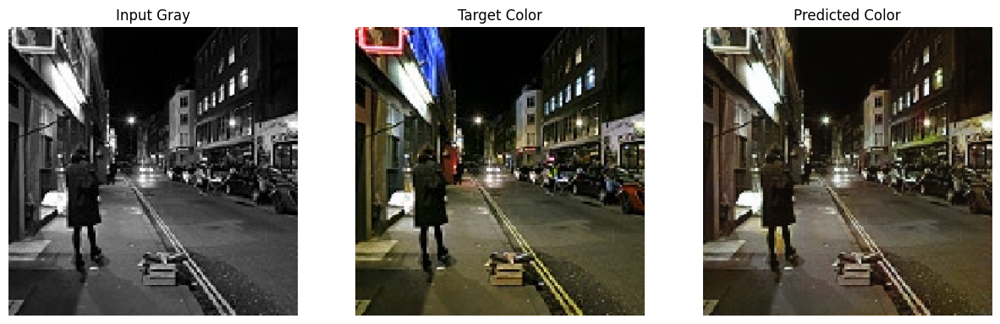

⏱️ Tempo da época 17: 280.27s

🔁 Época 18/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 18


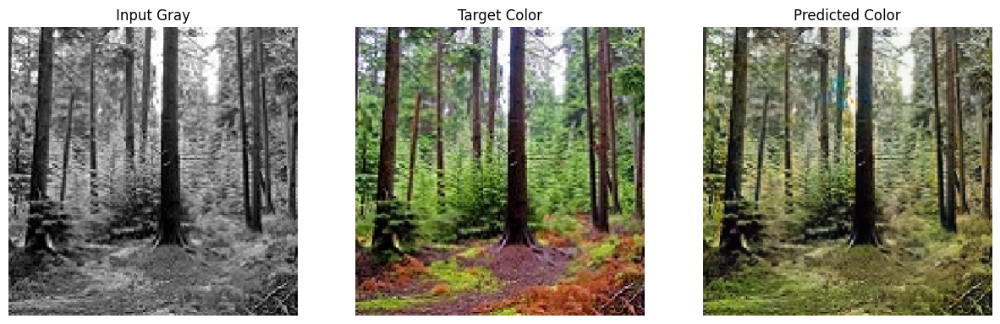

⏱️ Tempo da época 18: 279.89s

🔁 Época 19/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 19


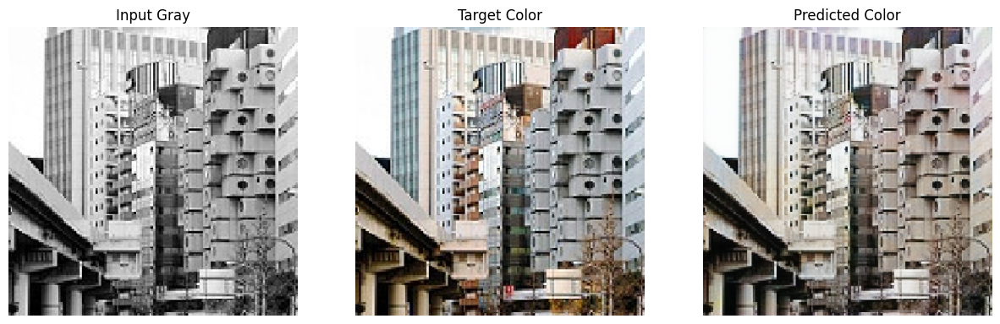

⏱️ Tempo da época 19: 280.82s

🔁 Época 20/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 20


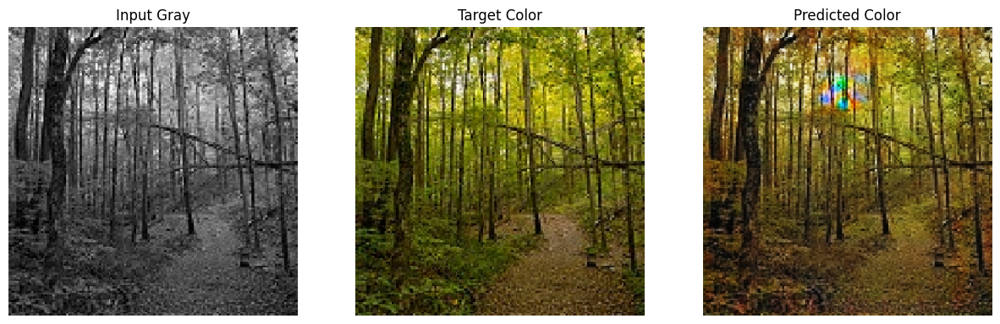

⏱️ Tempo da época 20: 280.55s

🔁 Época 21/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 21


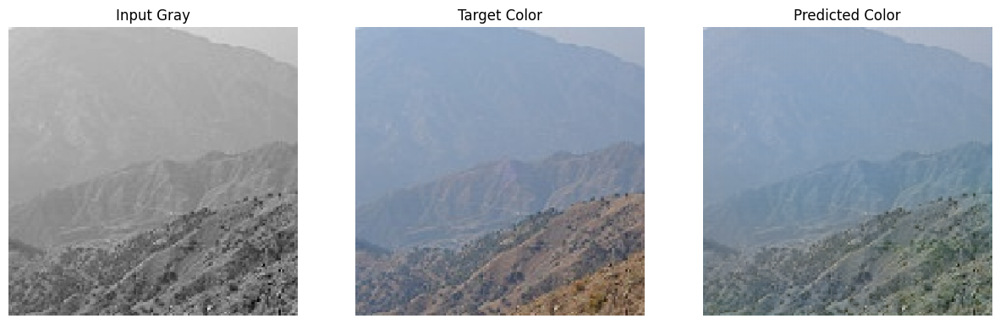

⏱️ Tempo da época 21: 279.99s

🔁 Época 22/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 22


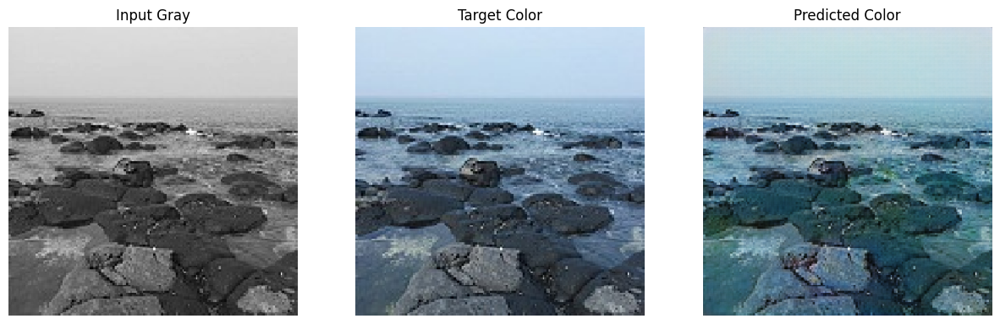

⏱️ Tempo da época 22: 280.19s

🔁 Época 23/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 23


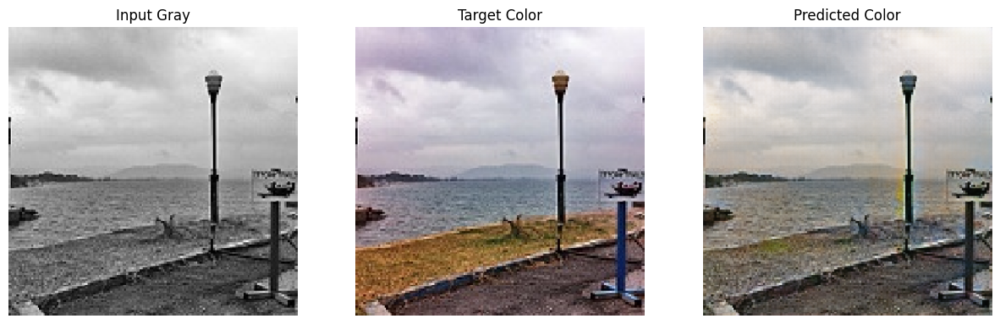

⏱️ Tempo da época 23: 280.02s

🔁 Época 24/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 24


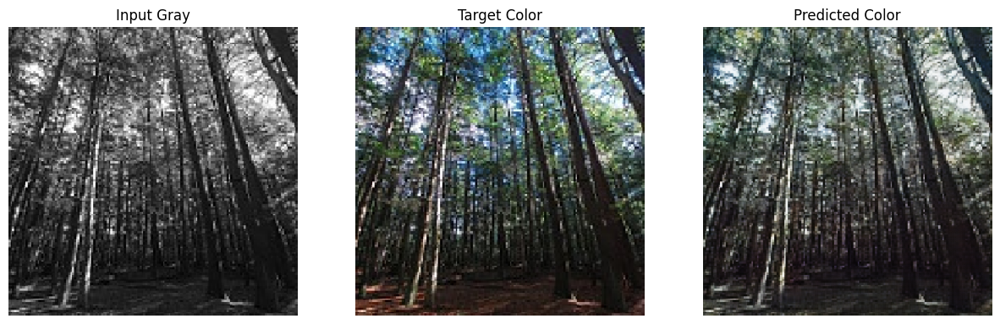

⏱️ Tempo da época 24: 280.35s

🔁 Época 25/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 25


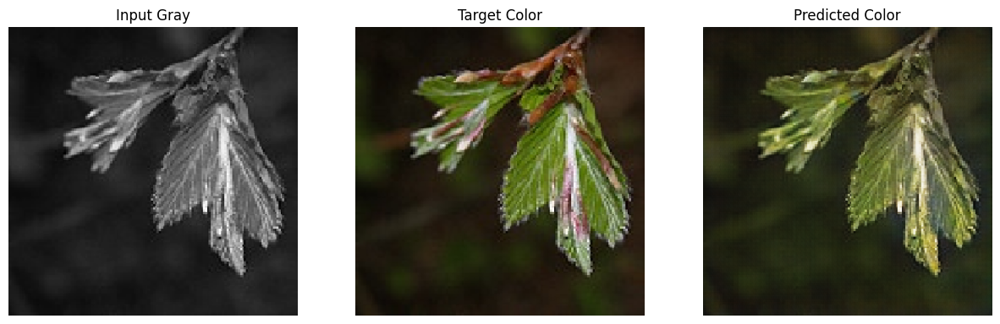

⏱️ Tempo da época 25: 279.76s

🔁 Época 26/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 26


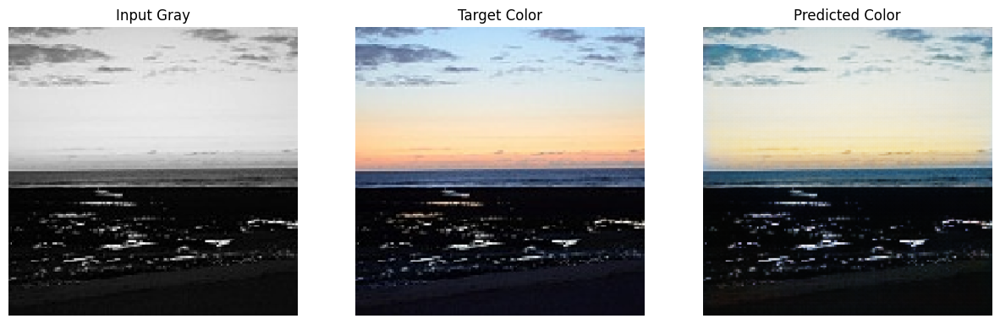

⏱️ Tempo da época 26: 280.99s

🔁 Época 27/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 27


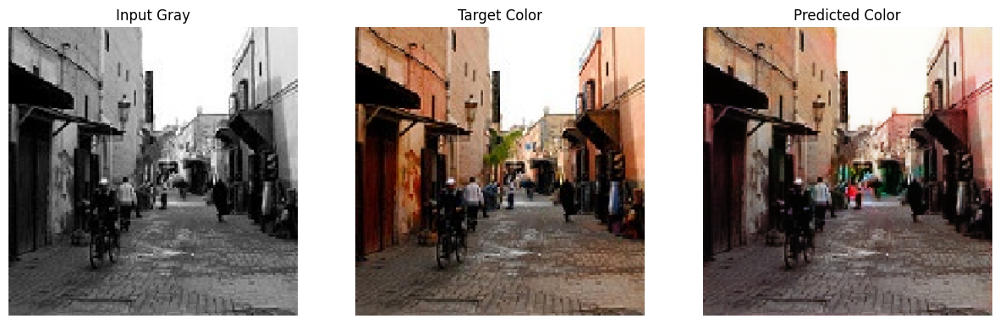

⏱️ Tempo da época 27: 280.34s

🔁 Época 28/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 28


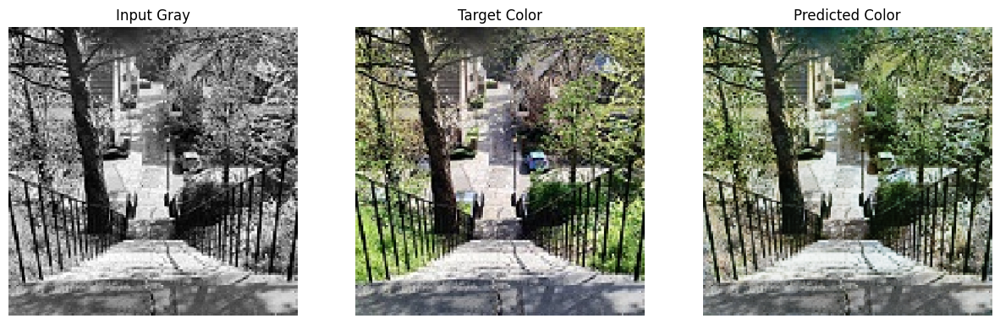

⏱️ Tempo da época 28: 280.66s

🔁 Época 29/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 29


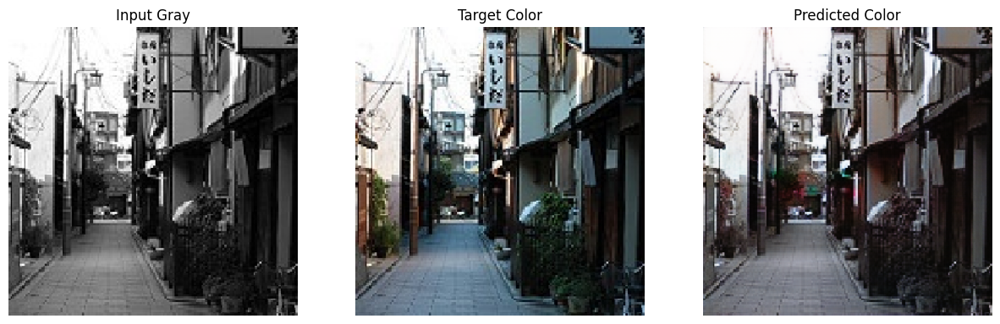

⏱️ Tempo da época 29: 280.56s

🔁 Época 30/30
 - Batch 0
 - Batch 100
 - Batch 200
 - Batch 300
 - Batch 400
🎨 Resultados da época 30


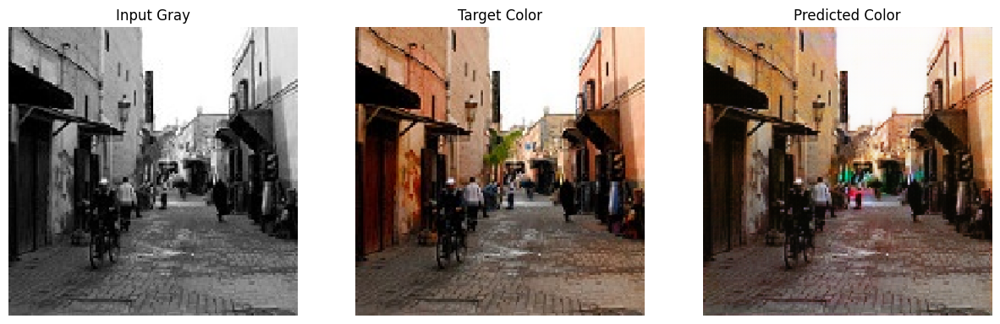

⏱️ Tempo da época 30: 280.21s


In [10]:
import time  # ✅ Adicione esta linha

EPOCHS = 30

for epoch in range(EPOCHS):
    print(f"\n🔁 Época {epoch+1}/{EPOCHS}")
    start = time.time()

    for n, (input_image, target) in enumerate(dataset):
        train_step(input_image, target)
        if n % 100 == 0:
            print(f" - Batch {n}")

    for test_input, test_target in dataset.take(1):
        print(f"🎨 Resultados da época {epoch+1}")
        generate_images(generator, test_input, test_target)

    print(f"⏱️ Tempo da época {epoch+1}: {time.time() - start:.2f}s")

In [11]:
# Salvar o modelo
generator.save("Pix2Pix_Colorizer.h5")

I0000 00:00:1751473052.756252      61 service.cc:148] XLA service 0x7adefed8df70 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1751473052.757181      61 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1751473052.757206      61 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
E0000 00:00:1751473056.453941      61 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1751473056.715297      61 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
I0000 00:00:1751473057.454446      61 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


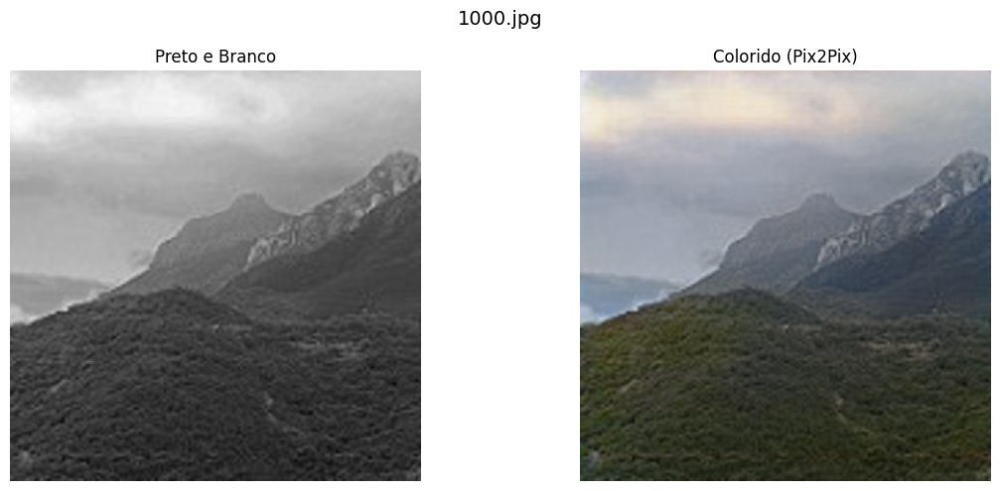

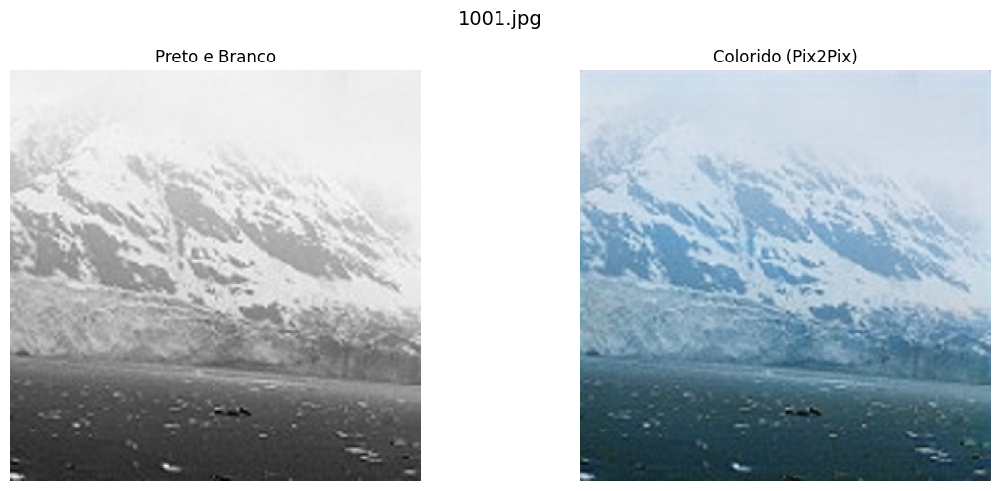

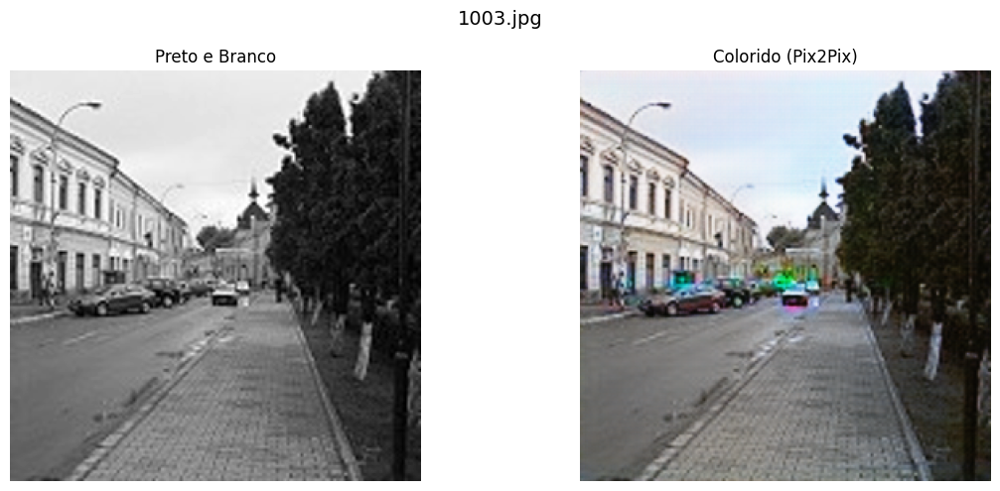

In [12]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os

# ✅ Lista de imagens preto e branco
imagens_pb = [
    "/kaggle/input/landscape-image-colorization/landscape Images/gray/1000.jpg",
    "/kaggle/input/landscape-image-colorization/landscape Images/gray/1001.jpg",
    "/kaggle/input/landscape-image-colorization/landscape Images/gray/1003.jpg"
]

# ✅ Carrega o modelo Pix2Pix (espera entrada 256x256x1)
generator = tf.keras.models.load_model(
    "/kaggle/working/Pix2Pix_Colorizer.h5",
    compile=False
)

# ✅ Corrigido: redimensiona para 256x256
def processar_imagem_pb(caminho, size=(256, 256)):
    img = Image.open(caminho).convert('L').resize(size)
    img_np = np.array(img).astype(np.float32) / 127.5 - 1.0  # Normaliza para [-1, 1]
    return img_np, img

# ✅ Gera imagem colorida com o gerador
def gerar_colorido(img_array):
    input_tensor = np.expand_dims(img_array, axis=(0, -1))  # (1, 256, 256, 1)
    pred = generator.predict(input_tensor, verbose=0)[0]    # (256, 256, 3)
    return (pred + 1) / 2.0  # Escala [0, 1]

# ✅ Exibe resultado lado a lado
def exibir_lado_a_lado(img_pb_original, img_colorida, nome):
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.title("Preto e Branco")
    plt.imshow(img_pb_original, cmap='gray')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.title("Colorido (Pix2Pix)")
    plt.imshow(img_colorida)
    plt.axis('off')
    
    plt.suptitle(nome, fontsize=14)
    plt.tight_layout()
    plt.show()

# ✅ Aplica em cada imagem
for caminho in imagens_pb:
    try:
        img_array, img_pb_original = processar_imagem_pb(caminho)
        img_colorida = gerar_colorido(img_array)
        nome_arquivo = os.path.basename(caminho)
        exibir_lado_a_lado(img_pb_original, img_colorida, nome_arquivo)
    except Exception as e:
        print(f"❌ Erro ao processar {caminho}: {e}")
